In [1]:
import pandas as pd, numpy as np, matplotlib.pyplot as plt
import plotly.express as px

In [2]:
df = pd.read_csv("weatherHistory.csv")

In [3]:
df.head()

,Formatted Date,Summary,Precip Type,Temperature (C),Apparent Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Loud Cover,Pressure (millibars),Daily Summary
0,2006-04-01 00:00:00.000 +0200,Partly Cloudy,rain,9.472222,7.388889,0.89,14.1197,251.0,15.8263,0.0,1015.13,Partly cloudy throughout the day.
1,2006-04-01 01:00:00.000 +0200,Partly Cloudy,rain,9.355556,7.227778,0.86,14.2646,259.0,15.8263,0.0,1015.63,Partly cloudy throughout the day.
2,2006-04-01 02:00:00.000 +0200,Mostly Cloudy,rain,9.377778,9.377778,0.89,3.9284,204.0,14.9569,0.0,1015.94,Partly cloudy throughout the day.
3,2006-04-01 03:00:00.000 +0200,Partly Cloudy,rain,8.288889,5.944444,0.83,14.1036,269.0,15.8263,0.0,1016.41,Partly cloudy throughout the day.
4,2006-04-01 04:00:00.000 +0200,Mostly Cloudy,rain,8.755556,6.977778,0.83,11.0446,259.0,15.8263,0.0,1016.51,Partly cloudy throughout the day.


In [4]:
df.columns

Index(['Formatted Date', 'Summary', 'Precip Type', 'Temperature (C)',
       'Apparent Temperature (C)', 'Humidity', 'Wind Speed (km/h)',
       'Wind Bearing (degrees)', 'Visibility (km)', 'Loud Cover',
       'Pressure (millibars)', 'Daily Summary'],
      dtype='object')

In [5]:
clean_df = df.drop(columns=["Formatted Date", "Daily Summary", "Visibility (km)", "Loud Cover","Wind Speed (km/h)", "Wind Bearing (degrees)", "Precip Type"])

In [6]:
clean_df["Summary"].value_counts()

Summary
Partly Cloudy                          31733
Mostly Cloudy                          28094
Overcast                               16597
Clear                                  10890
Foggy                                   7148
Breezy and Overcast                      528
Breezy and Mostly Cloudy                 516
Breezy and Partly Cloudy                 386
Dry and Partly Cloudy                     86
Windy and Partly Cloudy                   67
Light Rain                                63
Breezy                                    54
Windy and Overcast                        45
Humid and Mostly Cloudy                   40
Drizzle                                   39
Breezy and Foggy                          35
Windy and Mostly Cloudy                   35
Dry                                       34
Humid and Partly Cloudy                   17
Dry and Mostly Cloudy                     14
Rain                                      10
Windy                                      8
Hu

In [7]:
clean_df = clean_df.drop(clean_df[clean_df['Summary'] == 'Dangerously Windy and Partly Cloudy'].index)

In [8]:
clean_df["Summary"].value_counts()

Summary
Partly Cloudy               31733
Mostly Cloudy               28094
Overcast                    16597
Clear                       10890
Foggy                        7148
Breezy and Overcast           528
Breezy and Mostly Cloudy      516
Breezy and Partly Cloudy      386
Dry and Partly Cloudy          86
Windy and Partly Cloudy        67
Light Rain                     63
Breezy                         54
Windy and Overcast             45
Humid and Mostly Cloudy        40
Drizzle                        39
Breezy and Foggy               35
Windy and Mostly Cloudy        35
Dry                            34
Humid and Partly Cloudy        17
Dry and Mostly Cloudy          14
Rain                           10
Windy                           8
Humid and Overcast              7
Windy and Foggy                 4
Windy and Dry                   1
Breezy and Dry                  1
Name: count, dtype: int64

In [9]:
unwanted = ["Breezy and Overcast", "Breezy and Mostly Cloudy", "Breezy and Partly Cloudy", "Dry and Partly Cloudy","Windy and Partly Cloudy","Light Rain","Breezy", "Windy and Overcast", "Humid and Mostly Cloudy", "Dry and Mostly Cloudy", "Rain", "Windy", "Humid and Overcast", "Windy and Foggy", "Windy and Dry", "Breezy and Dry"]

In [10]:
for element in unwanted:
    clean_df = clean_df.drop(df[df['Summary'] == element].index)

In [11]:
clean_df['Summary'].value_counts()

Summary
Partly Cloudy              31733
Mostly Cloudy              28094
Overcast                   16597
Clear                      10890
Foggy                       7148
Drizzle                       39
Breezy and Foggy              35
Windy and Mostly Cloudy       35
Dry                           34
Humid and Partly Cloudy       17
Name: count, dtype: int64

In [12]:
clean_df.head()

,Summary,Temperature (C),Apparent Temperature (C),Humidity,Pressure (millibars)
0,Partly Cloudy,9.472222,7.388889,0.89,1015.13
1,Partly Cloudy,9.355556,7.227778,0.86,1015.63
2,Mostly Cloudy,9.377778,9.377778,0.89,1015.94
3,Partly Cloudy,8.288889,5.944444,0.83,1016.41
4,Mostly Cloudy,8.755556,6.977778,0.83,1016.51


In [13]:
clean_df = clean_df.drop(clean_df[clean_df['Summary'] == 'Foggy'].index)

In [14]:
clean_df['Summary'].value_counts()

Summary
Partly Cloudy              31733
Mostly Cloudy              28094
Overcast                   16597
Clear                      10890
Drizzle                       39
Breezy and Foggy              35
Windy and Mostly Cloudy       35
Dry                           34
Humid and Partly Cloudy       17
Name: count, dtype: int64

In [15]:
clean_df = clean_df.drop(clean_df[clean_df['Summary'] == 'Drizzle'].index)
clean_df = clean_df.drop(clean_df[clean_df['Summary'] == 'Breezy and Foggy'].index)
clean_df = clean_df.drop(clean_df[clean_df['Summary'] == 'Windy and Mostly Cloudy'].index)
clean_df = clean_df.drop(clean_df[clean_df['Summary'] == 'Dry'].index)
clean_df = clean_df.drop(clean_df[clean_df['Summary'] == 'Humid and Partly Cloudy'].index)

In [16]:
clean_df["Summary"].value_counts()

Summary
Partly Cloudy    31733
Mostly Cloudy    28094
Overcast         16597
Clear            10890
Name: count, dtype: int64

In [17]:
clean_df.head(5)

,Summary,Temperature (C),Apparent Temperature (C),Humidity,Pressure (millibars)
0,Partly Cloudy,9.472222,7.388889,0.89,1015.13
1,Partly Cloudy,9.355556,7.227778,0.86,1015.63
2,Mostly Cloudy,9.377778,9.377778,0.89,1015.94
3,Partly Cloudy,8.288889,5.944444,0.83,1016.41
4,Mostly Cloudy,8.755556,6.977778,0.83,1016.51


In [18]:
# clean_df.to_csv('final_dataset.csv')

In [24]:
df = pd.read_csv("final_dataset.csv")

In [26]:
df.shape

(87314, 6)

In [18]:
fig = px.box(df, y="Temperature (C)")
fig.show()

In [19]:
fig = px.box(df, y="Humidity")

fig.show()

In [20]:
fig = px.box(df, y="Pressure (millibars)")

fig.show()

In [21]:
# Function to remove outliers using the IQR method
def remove_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Filter out the outliers
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]



In [22]:
# Apply the function to each numerical column
numerical_columns = ['Temperature (C)', 'Apparent Temperature (C)', 'Humidity', 'Pressure (millibars)']
filtered_data = df.copy()

for column in numerical_columns:
    filtered_data = remove_outliers_iqr(filtered_data, column)

# Display the new shape of the dataset after outlier removal
filtered_data.shape

(83309, 6)

## Checking Box Plots after removing rows with outliers

In [36]:
fig = px.box(filtered_data, y="Temperature (C)")
fig.show()

In [37]:
fig = px.box(filtered_data, y="Humidity")
fig.show()

In [38]:
fig = px.box(filtered_data, y="Pressure (millibars)")

fig.show()

## Checking Correlation of Attributes

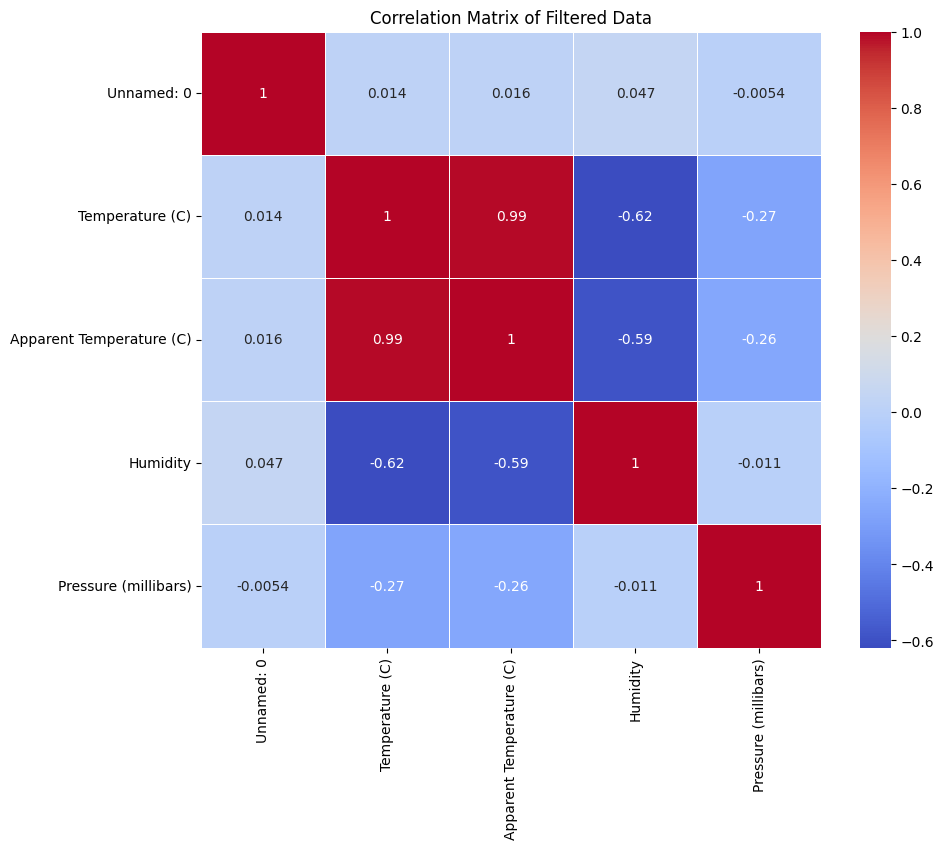

In [42]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'filtered_data' is your preprocessed DataFrame
numerical_data = filtered_data.select_dtypes(include=[np.number])  # Assuming 'filtered_data' is your DataFrame

# Calculate the correlation matrix
correlation_matrix = numerical_data.corr(method='pearson')

# Use seaborn to create a heatmap to visualize the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5)

# Display the heatmap
plt.title('Correlation Matrix of Filtered Data')
plt.show()


In [47]:
filtered_data.drop(columns = ["Unnamed: 0"])

,Summary,Temperature (C),Apparent Temperature (C),Humidity,Pressure (millibars)
0,Partly Cloudy,9.472222,7.388889,0.89,1015.13
1,Partly Cloudy,9.355556,7.227778,0.86,1015.63
2,Mostly Cloudy,9.377778,9.377778,0.89,1015.94
3,Partly Cloudy,8.288889,5.944444,0.83,1016.41
4,Mostly Cloudy,8.755556,6.977778,0.83,1016.51
...,...,...,...,...,...
87309,Partly Cloudy,26.016667,26.016667,0.43,1014.36
87310,Partly Cloudy,24.583333,24.583333,0.48,1015.16
87311,Partly Cloudy,22.038889,22.038889,0.56,1015.66
87312,Partly Cloudy,21.522222,21.522222,0.60,1015.95


In [48]:
filtered_data.to_csv('filtered_dataset.csv')